### Import & Utility Function

In [1]:
import pandas as pd
import numpy as np

from glob import glob
from PIL import Image
import cv2
import matplotlib.pylab as plt

plt.style.use('ggplot')
import PIL
from PIL import Image
import os

from numpy import asarray

import tensorflow as tf
from tensorflow.keras import datasets, layers, models


2023-12-20 21:33:34.012415: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]

In [14]:
def plot_n(row,col,total,input):
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(frames):
        ax = plt.subplot(row, col, i + 1)
        plt.imshow(input[i])
        plt.title(i)
        plt.axis("off")

In [15]:
def plot_1sample(x, y, index):
    #plt.figure(figsize = (15,2))
    plt.imshow(x[index])
    plt.xlabel(classes[y[index]])

### Prepare Training Data

In [2]:
train_yes = glob(r"/Users/magzhang/IdeaProjects/Ruby's Science Project 2023/New Model/dataset/train/yes/*.png")
train_no = glob(r"/Users/magzhang/IdeaProjects/Ruby's Science Project 2023/New Model/dataset/train/no/*.png")

In [409]:
X_train=[]
Y_train=[]
for i in range(len(train_yes)):
    img_cv2 = cv2.imread(train_yes[i])
    img_cv2 = crop_center_square(img_cv2)
    img_cv2=cv2.resize(img_cv2,(256, 256))
    X_train.append(img_cv2)
    Y_train.append(0) #note I switched the label to 1, as "yes" means eye is open
    
for i in range(len(train_no)):
    img_cv2 = cv2.imread(train_no[i])
    img_cv2 = crop_center_square(img_cv2)
    img_cv2=cv2.resize(img_cv2,(256, 256))
    X_train.append(img_cv2)
    Y_train.append(1)
X_train=np.array(X_train)  
Y_train=np.array(Y_train)  


In [438]:
#hand label from live video capture
X_train=np.append(X_train,frames,axis=0)
Y_train=np.append(Y_train,lables,axis=0)

In [439]:
X_train.shape, Y_train.shape

((346, 256, 256, 3), (346,))

### Prepare Test Data

In [108]:
test_yes = glob(r"/Users/magzhang/IdeaProjects/Ruby's Science Project 2023/New Model/dataset/test/yes/*.png")
test_no = glob(r"/Users/magzhang/IdeaProjects/Ruby's Science Project 2023/New Model/dataset/test/no/*.png")

In [109]:
X_test=[]
Y_test=[]
for i in range(len(test_yes)):
    img_cv2 = cv2.imread(test_yes[i])
    img_cv2 = crop_center_square(img_cv2)
    img_cv2=cv2.resize(img_cv2,(256, 256))
    X_test.append(img_cv2)
    Y_test.append(0) #note I switched the label to 1, as "yes" means eye is open
for i in range(len(test_no)):
    img_cv2 = cv2.imread(test_no[i])
    img_cv2 = crop_center_square(img_cv2)
    img_cv2=cv2.resize(img_cv2,(256, 256))
    X_test.append(img_cv2)
    Y_test.append(1)
    
X_test=np.array(X_test)  
Y_test=np.array(Y_test) 

In [110]:
Y_test.shape, X_test.shape

((22,), (22, 256, 256, 3))

In [111]:
len(test_yes)

10

In [112]:
Y_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

### Plot Sample

In [113]:
classes = ["eye is open","eye is closed"]

In [126]:
def plot_sample(X, y, index):
    #plt.figure(figsize = (15,2))
    plt.imshow(X[index])
    plt.xlabel(classes[y[index]])

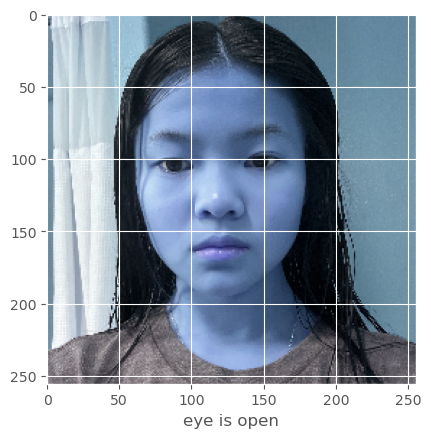

In [133]:
plot_sample(X_train, Y_train, 10)

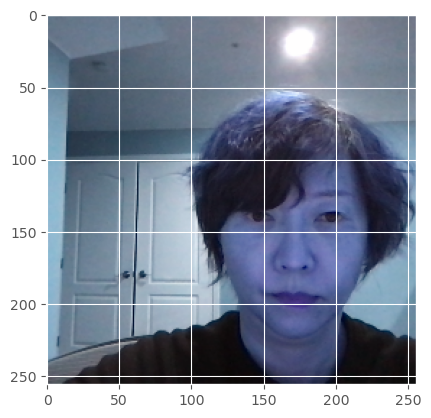

In [120]:
frame = crop_center_square(frame)
frame=cv2.resize(frame,(256, 256))
def plot_sample(X):
    #plt.figure(figsize = (15,2))
    plt.imshow(X)
    #plt.xlabel(classes[y[index]])
plot_sample(frame)

### Normalized the data

In [442]:
X_train = X_train / 255.0
X_test = X_test / 255.0

### Train CNN Model

In [479]:
cnn = models.Sequential([
    layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(256, 256, 3)),
    layers.MaxPooling2D((2, 2)),
    
    layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    
#     layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
#     layers.MaxPooling2D((2, 2)),
    
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

In [480]:
cnn.compile(optimizer='adam',
              loss=tf.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

In [481]:
cnn.fit(X_train, Y_train, epochs=15)

Epoch 1/15
11/11 [==============================] - 10s 801ms/step - loss: 5.0289 - accuracy: 0.4595
Epoch 2/15
11/11 [==============================] - 9s 777ms/step - loss: 0.6197 - accuracy: 0.6272
Epoch 3/15
11/11 [==============================] - 8s 759ms/step - loss: 0.4923 - accuracy: 0.6994
Epoch 4/15
11/11 [==============================] - 8s 767ms/step - loss: 0.4098 - accuracy: 0.7486
Epoch 5/15
11/11 [==============================] - 9s 785ms/step - loss: 0.3855 - accuracy: 0.7659
Epoch 6/15
11/11 [==============================] - 9s 795ms/step - loss: 0.3224 - accuracy: 0.8382
Epoch 7/15
11/11 [==============================] - 9s 771ms/step - loss: 0.2720 - accuracy: 0.8786
Epoch 8/15
11/11 [==============================] - 9s 774ms/step - loss: 0.2052 - accuracy: 0.9220
Epoch 9/15
11/11 [==============================] - 9s 782ms/step - loss: 0.1233 - accuracy: 0.9711
Epoch 10/15
11/11 [==============================] - 8s 770ms/step - loss: 0.0946 - accuracy: 0.971

In [482]:
cnn.evaluate(X_test,Y_test)

1/1 [==============================] - 0s 236ms/step - loss: 4.8170 - accuracy: 0.4545


[4.817009449005127, 0.4545454680919647]

### Evaluate the Model

In [485]:
img_cv2 = cv2.imread(train_no[30])
img_cv2=cv2.resize(img_cv2,(256, 256))

#img_cv2=img_cv2[None,...]
# img_cv2=img_cv2/255
# img_cv2.shape  
yhat = cnn.predict(np.expand_dims(img_cv2/255, 0))
yhat
#yhat = (1 if pred>0.5 else 0)
# y=yhat+1
# y

1/1 [==============================] - 0s 48ms/step


array([[0.99999976]], dtype=float32)

In [155]:
yhat = new_model.predict(np.expand_dims(frame, 0))
yhat

1/1 [==============================] - 0s 49ms/step


array([[1.]], dtype=float32)

### Save the Model

In [3]:
from tensorflow.keras.models import load_model

In [486]:
cnn.save(os.path.join("/Users/magzhang/IdeaProjects/Ruby's Science Project 2023/New Model/models","cnn.h32_64"))

INFO:tensorflow:Assets written to: /Users/magzhang/IdeaProjects/Ruby's Science Project 2023/New Model/models/cnn.h32_64/assets


INFO:tensorflow:Assets written to: /Users/magzhang/IdeaProjects/Ruby's Science Project 2023/New Model/models/cnn.h32_64/assets


In [4]:
model = load_model(os.path.join("/Users/magzhang/IdeaProjects/Ruby's Science Project 2023/New Model/models","cnn.h5"))

2023-12-20 21:34:36.101781: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [154]:
yhat = new_model.predict(np.expand_dims(frame/255, 0))

1/1 [==============================] - 0s 46ms/step


In [143]:
pred=(yhat.squeeze())
yhat1 = (1 if pred>0.5 else 0)
yhat1
pred

array(0.00017077, dtype=float32)

### Deploy model

In [488]:
import cv2
import serial 
import time 
import numpy as np

arduino = serial.Serial(port='/dev/tty.usbmodem14301', baudrate=9600, timeout=.1) 



#open webcam
camera = cv2.VideoCapture(0)
preds = []
current=0
count=0

while True:
    ret, frame = camera.read()
    cv2.imshow('Video', frame)
    
    frame = crop_center_square(frame)
    frame = cv2.resize(frame, (256,256)) 
    
    pred=cnn.predict(np.expand_dims(frame/255, 0)).squeeze()
    yhat = (1 if pred>0.50 else 0)
    preds.append(pred)
    if yhat!=current:
        count+=1
        current=yhat
    
    
    if count == 6:
        count=0
        cmd = '1'
        while True:
            if cv2.waitKey(1) & 0xFF == ord('q'):
                cmd='0'
                arduino.write(bytes(cmd, 'utf-8'))
                break 
            arduino.write(bytes(cmd, 'utf-8'))


    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

camera.release()
cv2.destroyAllWindows() 
cv2.waitKey(1)
cv2.waitKey(1)
cv2.waitKey(1)
cv2.waitKey(1)


1/1 [==============================] - 0s 46ms/step


-1

In [474]:
preds

[array(0.68737763, dtype=float32),
 array(0.33128744, dtype=float32),
 array(0.30654556, dtype=float32),
 array(0.28128827, dtype=float32),
 array(0.24307273, dtype=float32),
 array(0.2868947, dtype=float32),
 array(0.29661587, dtype=float32),
 array(0.27317727, dtype=float32),
 array(0.2100994, dtype=float32),
 array(0.30104885, dtype=float32),
 array(0.2934973, dtype=float32),
 array(0.26767182, dtype=float32),
 array(0.26762414, dtype=float32),
 array(0.34003618, dtype=float32),
 array(0.2793526, dtype=float32),
 array(0.25149667, dtype=float32),
 array(0.23177445, dtype=float32),
 array(0.13132669, dtype=float32),
 array(0.03680189, dtype=float32),
 array(0.07853965, dtype=float32),
 array(0.06181475, dtype=float32),
 array(0.10951182, dtype=float32),
 array(0.13907358, dtype=float32),
 array(0.2194847, dtype=float32),
 array(0.3383321, dtype=float32),
 array(0.36709407, dtype=float32),
 array(0.3300601, dtype=float32),
 array(0.32655215, dtype=float32),
 array(0.1948899, dtype=flo

In [472]:
count

5

In [153]:
frame

array([[[ 94, 113, 130],
        [ 95, 114, 131],
        [ 95, 114, 131],
        ...,
        [107, 113, 128],
        [106, 112, 129],
        [109, 115, 132]],

       [[ 90, 111, 128],
        [ 91, 112, 129],
        [ 93, 114, 131],
        ...,
        [105, 113, 126],
        [104, 112, 127],
        [109, 117, 132]],

       [[ 95, 115, 132],
        [ 92, 113, 129],
        [ 93, 114, 131],
        ...,
        [105, 114, 128],
        [107, 116, 130],
        [109, 117, 132]],

       ...,

       [[ 35,  32,  34],
        [ 34,  32,  32],
        [ 31,  28,  28],
        ...,
        [ 34,  26,  27],
        [ 33,  25,  26],
        [ 32,  24,  25]],

       [[ 32,  31,  31],
        [ 33,  31,  31],
        [ 31,  28,  28],
        ...,
        [ 28,  23,  24],
        [ 28,  24,  25],
        [ 30,  26,  26]],

       [[ 31,  31,  31],
        [ 31,  29,  30],
        [ 31,  28,  28],
        ...,
        [ 27,  23,  24],
        [ 28,  25,  25],
        [ 28,  26,  26]]

### debugging/improving the model by adding more training sample

In [5]:
#open webcam
camera = cv2.VideoCapture(0)
preds = []
frames=[]
current=0
count=0

while True:
    ret, frame = camera.read()
    cv2.imshow('Video', frame)
    
    count+=1
    frame = crop_center_square(frame)
    frame = cv2.resize(frame, (256,256)) 
    
    pred=model.predict(np.expand_dims(frame/255, 0)).squeeze()
   
    
    preds.append(pred)
    frames.append(frame)   
   
    if count==40:
        break

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

camera.release()
cv2.destroyAllWindows() 
cv2.waitKey(1)
cv2.waitKey(1)
cv2.waitKey(1)
cv2.waitKey(1)

1/1 [==============================] - 0s 40ms/step


-1

In [413]:
frames=np.array(frames)
#frames[2]
cnn.predict(np.expand_dims(frames[0]/255, 0)).squeeze()

1/1 [==============================] - 0s 43ms/step


array(0.27617112, dtype=float32)

In [414]:
frames.shape

(40, 256, 256, 3)

In [13]:
def plot_n(row,col,total,input):

    plt.figure(figsize=(10, 10))

    for i, img in enumerate(frames):
        ax = plt.subplot(row, col, i + 1)
        plt.imshow(input[i])
        plt.title(i)
        plt.axis("off")
  

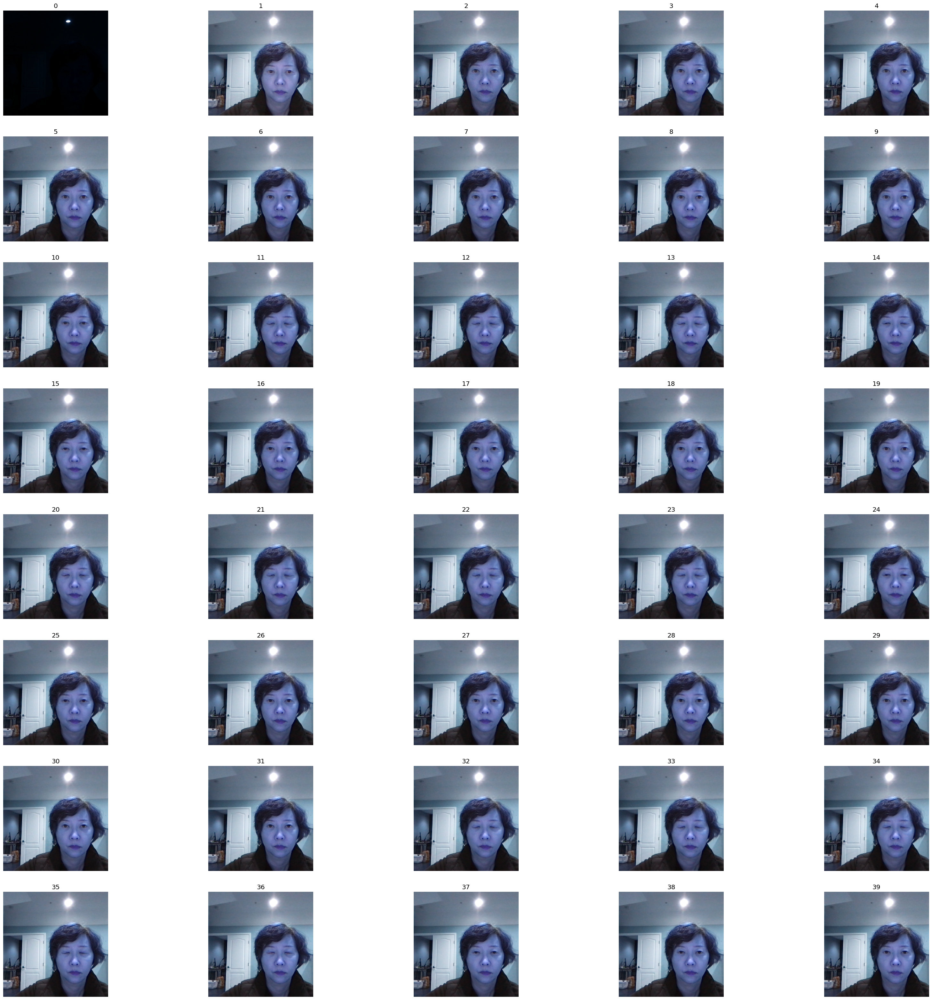

In [11]:
plot_n(8,5,40,frames)

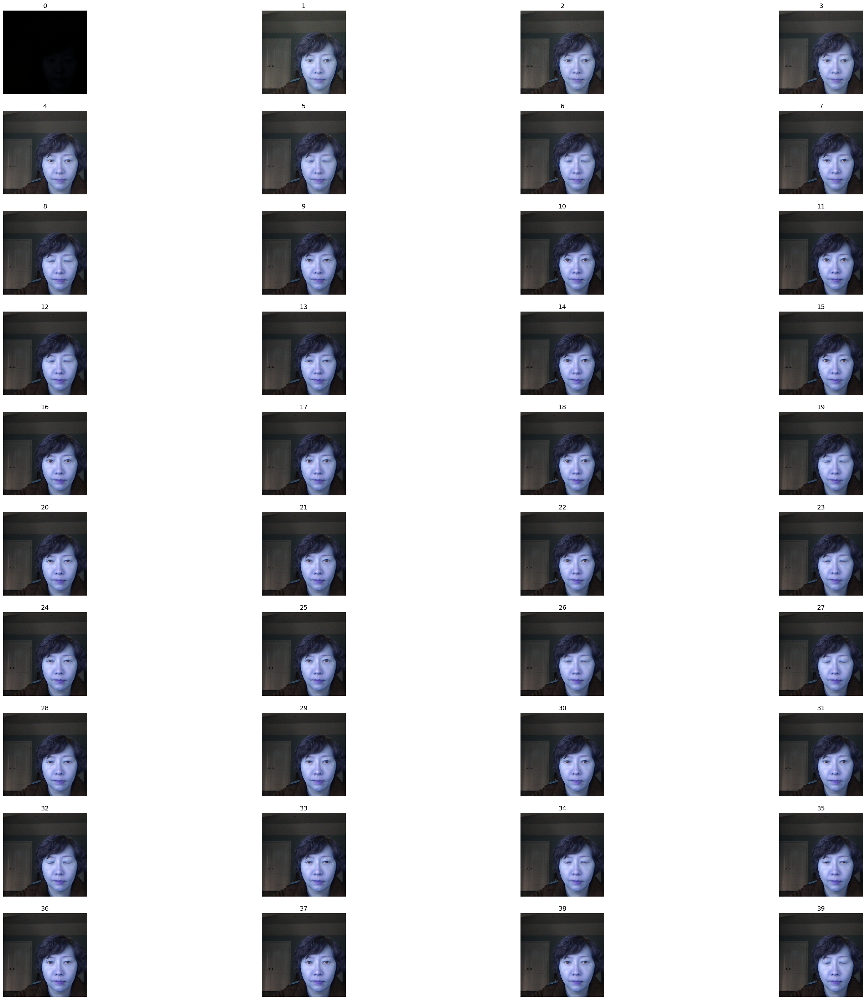

In [435]:
#import libraries 
import cv2 
from matplotlib import pyplot as plt 


# create figure 
fig = plt.figure(figsize=(40, 40)) 
  
# setting values to rows and column variables 
rows = 10
columns = 4
  

for i, img in enumerate(frames):
    #axs[i].imshow(frames[i])
    fig.add_subplot(rows, columns, (i+1)) 
    plt.imshow(frames[i]) 
    plt.axis('off') 
    plt.title(i)

In [436]:
lables=[0,0,0,0,0,1,1,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,1,0,1,1,1,0,0,0,1,1,1,1,0,0,0,1]

In [437]:
len(lables)

40